In [214]:
from IPython.display import Image
Image(filename='MapaGrafos.png', width=1000, height=1200)

In [215]:
import numpy as np
import csv 
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import HTML
from pandas import DataFrame

In [216]:
data = pd.read_csv('vertices.csv', delimiter =r";", encoding='latin1')
dvc = pd.DataFrame(data=data)
dvc.set_index("Punto_Muestreo", inplace = True)
dvc

,Tipo,Nombre
Punto_Muestreo,,
1,Piezometro,1
2,Piezometro,2
3,Piezometro,3
4,Piezometro,4
5,Piezometro,5
6,Piezometro,6
7,Piezometro,7
8,Piezometro,8
9,Piezometro,9


In [217]:
data = pd.read_csv('Aristas.csv', delimiter =r";", encoding='latin1')
dar = pd.DataFrame(data=data)
dar.set_index("Arista", inplace = True)
dar

,Vertice Inicio,Vertice Final,Distancia
Arista,,,
1,1,7,2.064972
2,1,19,1.347286
3,1,2,1.597165
4,1,6,1.190719
5,2,3,1.629219
...,...,...,...
98,30,31,1.846587
99,31,30,1.846587
100,32,33,1.513610


In [218]:
import matplotlib.pyplot as plt
import networkx as nx
import graphviz as pgv
Dar=nx.DiGraph()
for row in dar.iterrows():
    Dar.add_edge(row[1]["Vertice Inicio"],
                row[1]["Vertice Final"],
                distancia=row[1]["Distancia"])

In [219]:
Dar.nodes(data=True)

NodeDataView({1.0: {}, 7.0: {}, 19.0: {}, 2.0: {}, 6.0: {}, 3.0: {}, 8.0: {}, 4.0: {}, 10.0: {}, 9.0: {}, 27.0: {}, 26.0: {}, 5.0: {}, 28.0: {}, 22.0: {}, 23.0: {}, 24.0: {}, 25.0: {}, 11.0: {}, 12.0: {}, 13.0: {}, 14.0: {}, 15.0: {}, 16.0: {}, 17.0: {}, 18.0: {}, 20.0: {}, 21.0: {}, 29.0: {}, 32.0: {}, 30.0: {}, 31.0: {}, 33.0: {}})

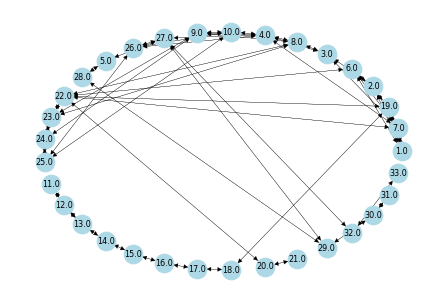

In [220]:
nx.draw_circular(Dar,
                node_color="lightblue",
                edge_color="black", 
                font_size=8, 
                width=0.25, 
                with_labels=True, 
                node_size=350
)

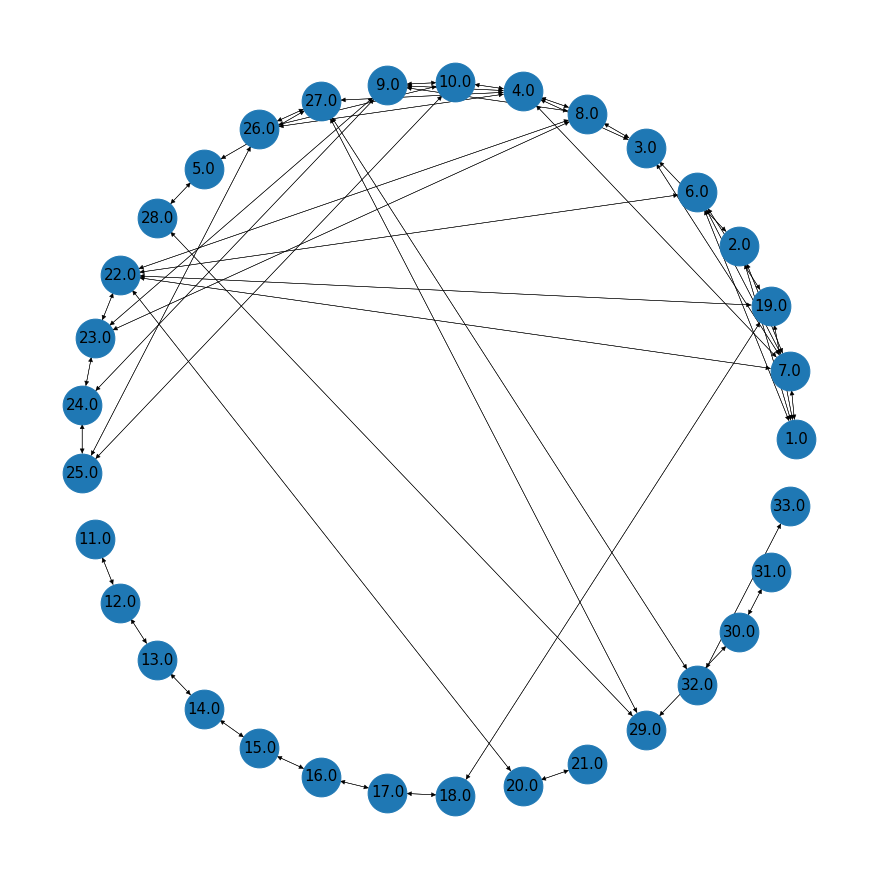

In [221]:
plt.figure(3,figsize=(12,12)) 
nx.draw_circular(Dar,with_labels=True,node_size=1500, font_size=15,width=0.5)
plt.show()

In [222]:
Dar.nodes(data=True)

NodeDataView({1.0: {}, 7.0: {}, 19.0: {}, 2.0: {}, 6.0: {}, 3.0: {}, 8.0: {}, 4.0: {}, 10.0: {}, 9.0: {}, 27.0: {}, 26.0: {}, 5.0: {}, 28.0: {}, 22.0: {}, 23.0: {}, 24.0: {}, 25.0: {}, 11.0: {}, 12.0: {}, 13.0: {}, 14.0: {}, 15.0: {}, 16.0: {}, 17.0: {}, 18.0: {}, 20.0: {}, 21.0: {}, 29.0: {}, 32.0: {}, 30.0: {}, 31.0: {}, 33.0: {}})

In [224]:
GR = {'1': ['7', '19', '2', '6'], '2': ['3', '1', '7'],'3': ['8', '4', '2', '7'],
        '4': ['10', '9', '3', '7', '27', '8', '26'],'5': ['27', '28'],
        '6': ['22', '19', '7', '1'],'7': ['4', '1', '22', '2', '3', '6'],
        '8': ['9', '23', '3', '22', '4'],'9': ['24', '4', '8', '23', '10'],
        '10': ['26', '25', '4', '9'],'11': ['12'],'12': ['13', '11'],
        '13': ['14', '12'],'14': ['13', '15'],'15': ['16', '14'],'16': ['17', '15'],
        '17': ['18', '16'],'18': ['19', '17'],'19': ['1', '6', '18', '22'],
        '20': ['21', '22'],'21': ['20'],'22': ['7', '8', '6', '23', '20', '19'],
        '23': ['8', '9', '22', '24'], '24': ['9', '23', '25'],'25': ['10', '24', '26'],
        '26': ['10', '4', '25', '27'],'27': ['4', '5', '26', '29', '32'],'28': ['5', '29'],
        '29': ['27', '28', '30'],'30': ['29', '31'],'31': ['30'], '32': ['33', '27'],
        '33': ['32']
     }        

In [225]:
def find_all_paths(graph, start, end, path=[],):
        path = path + [start]
        if start == end:
            return [path]
        if not graph.__contains__(start):
            return []
        paths = []
        for node in graph[start]:
            if node not in path:
                newpaths = find_all_paths(graph, node, end, path)
                for newpath in newpaths:
                    paths.append(newpath)                    
        return paths           

In [226]:
print(find_all_paths(GR, '30', '27'))
x=len(find_all_paths(GR, '30', '27'))
print("Numero de posibles caminos = %d" %x)

[['30', '29', '27'], ['30', '29', '28', '5', '27']]
Numero de posibles caminos = 2


In [227]:
class Graph(): 
  
    def __init__(self, vertices): 
        self.V = vertices 
        self.graph = [[0 for column in range(vertices)]  
                    for row in range(vertices)] 
  
    def printSolution(self, dist): 
        print ("Vertex \tDistance from Source")
        for node in range(self.V): 
            print (node, "\t", dist[node]) 

    def minDistance(self, dist, sptSet): 

        min = sys.maxsize 

        for v in range(self.V): 
            if dist[v] < min and sptSet[v] == False: 
                min = dist[v] 
                min_index = v 
  
        return min_index 

    def dijkstra(self, src): 
  
        dist = [sys.maxsize] * self.V 
        dist[src] = 0
        sptSet = [False] * self.V   
        for cout in range(self.V): 
 
            u = self.minDistance(dist, sptSet) 
            sptSet[u] = True
            for v in range(self.V): 
                if self.graph[u][v] > 0 and sptSet[v] == False and dist[v] > dist[u] + self.graph[u][v]: 
                        dist[v] = dist[u] + self.graph[u][v] 
  
        self.printSolution(dist) 

In [228]:
# Driver program 
g = Graph(8) 
g.graph = [[0, 4, 0, 0, 0, 0, 0, 8, 0], 
        [4, 0, 8, 0, 0, 0, 0, 11, 0], 
        [0, 8, 0, 7, 0, 4, 0, 0, 2], 
        [0, 0, 7, 0, 9, 14, 0, 0, 0], 
        [0, 0, 0, 9, 0, 10, 0, 0, 0], 
        [0, 0, 4, 14, 10, 0, 2, 0, 0], 
        [0, 0, 0, 0, 0, 2, 0, 1, 6], 
        [8, 11, 0, 0, 0, 0, 1, 0, 7], 
        [0, 0, 2, 0, 0, 0, 6, 7, 0] 
        ]; 
  
g.dijkstra(0);

Vertex 	Distance from Source
0 	 0
1 	 4
2 	 12
3 	 19
4 	 21
5 	 11
6 	 9
7 	 8
